<a href="https://colab.research.google.com/github/lolokidd/MS/blob/main/td_trafic_network_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TD analyse de graphe botnet

In [ ]:
import sys
!{sys.executable} -m pip install plotly pandas statsmodels networkx

In [ ]:
import random
import numpy as np
import networkx as nx
from collections import defaultdict
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd

# I. Statistiques descriptives du jeu de données ISOT

In [ ]:
EDGE_PATH = 'isot_edges_unique_with_dest_port.csv'
NODE_PATH = 'isot_nodes.csv'

#### 1) Charger le fichier de liens avec Pandas

In [ ]:

df_edges = pd.read_csv(EDGE_PATH)
print(df_edges.head())

        ip_source ip_destination  port_destination  malicious  length  \
0    192.168.50.1    224.0.0.251              5353      False   14529   
1    192.168.50.1    224.0.0.251              5353       True  228660   
2  192.168.50.101  192.168.50.88                53       True   32968   
3  192.168.50.102  192.168.50.88                53       True   33258   
4  192.168.50.103  192.168.50.88                53       True   33384   

   packets  mean_length_by_packet  
0      167                  87.00  
1     1325                 172.57  
2      439                  75.10  
3      438                  75.93  
4      444                  75.19  


#### 2) Afficher l'histogramme de la colonne 'packets' (le nombre de connexions de la source à la target). Que constatez-vous ?

<Axes: >

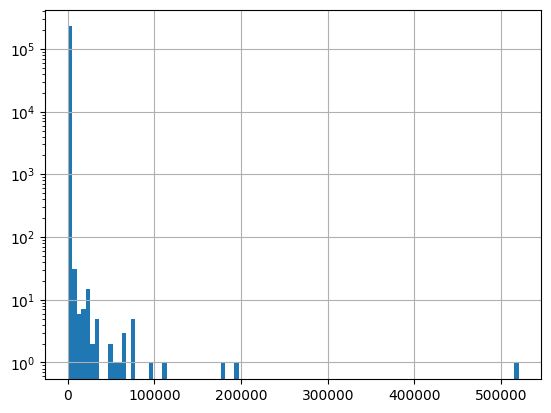

In [ ]:
df_edges['packets'].hist(bins=100, log=True)


Certains liens sont très fréquents, ce qui veut dire que certaines IP ont effectuées un très grand nombre de connexions à d'autres.

#### 3) Afficher l'histogramme de la colonne 'length' (le poids total des échanges réalisés lors des connexons). Que constatez-vous ?

<Axes: >

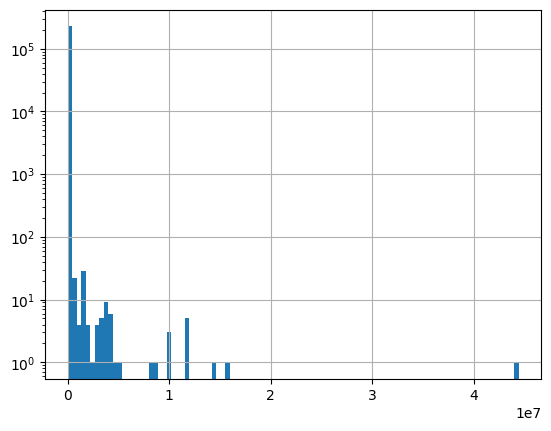

In [ ]:
df_edges['length'].hist(bins=100, log=True)

Quelques packets transportent de grande quantitées de données.

#### 4) Afficher un scatter plot des liens avec en abcisse le nombre de connexions ('packets') et en ordonné le poids total des échanges ('length'). Que remarquez-vous ?

<Axes: xlabel='packets', ylabel='length'>

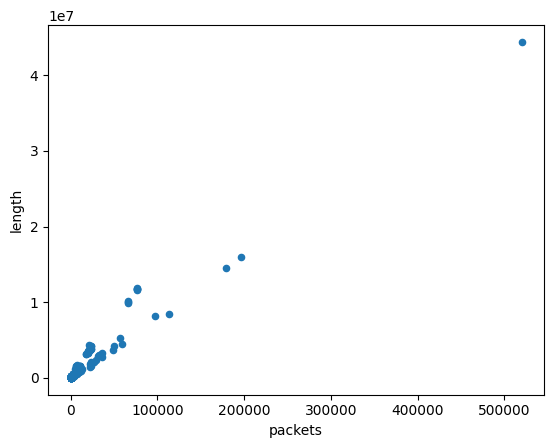

In [ ]:
df_edges.plot.scatter(x='packets', y='length')

Constat : à compléter

#### 5) En prenant en compte le graphique précédent, afficher les liens qui vous semblent intéressants

In [ ]:
interesting_links = df_edges[(df_edges['packets'] > 1000) & (df_edges['length'] > 1000)]

Constat : à compléter

# II. Construction du graphe: IP Source -> port IP Dest <- IP Dest

**Création de la colonne 'ip_port_destination'**

In [ ]:
df_edges['port_destination'] = df_edges['port_destination'].astype(str)
df_edges['ip_port_destination'] = df_edges['port_destination'] + ' (' + df_edges['ip_destination'] + ')'

**Creation d'une liste de liens entre les Target et leurs ports interrogés**

In [ ]:
# on crée une copie du dataframe `df_edges`
df_edges_target_ip = df_edges.copy()

# suppression des doublons
df_edges_target_ip = df_edges_target_ip[['ip_destination', 'ip_port_destination']].drop_duplicates()

# ajout d'une colonne `edge_type`
df_edges_target_ip['edge_type'] = 'HAS_PORT'

# renommage des colonnes
df_edges_target_ip.rename({'ip_destination': 'Source', 'ip_port_destination': 'Target'}, inplace=True, axis=1)

df_edges_target_ip

,Source,Target,edge_type
0,224.0.0.251,5353 (224.0.0.251),HAS_PORT
2,192.168.50.88,53 (192.168.50.88),HAS_PORT
10,192.168.50.255,137 (192.168.50.255),HAS_PORT
12,224.0.0.252,5355 (224.0.0.252),HAS_PORT
13,239.255.255.250,1900 (239.255.255.250),HAS_PORT
...,...,...,...
228119,ff02::1:2,547 (ff02::1:2),HAS_PORT
228120,ff02::1:3,5355 (ff02::1:3),HAS_PORT
228121,ff02::c,1900 (ff02::c),HAS_PORT
228142,ff02::c,3702 (ff02::c),HAS_PORT


No charts were generated by quickchart


**Construction des liens de entre les sources et les ports des targets**

In [ ]:
# on crée une copie du dataframe `df_edges`
df_edges_source_target_ip = df_edges.copy()

# ajout d'une colonne `edge_type`
df_edges_source_target_ip['edge_type'] = 'HAS_CONNECTION'

# suppression de colonnes
df_edges_source_target_ip.drop(['ip_destination', 'port_destination'], axis=1, inplace=True)

# renommage des colonnes
df_edges_source_target_ip.rename({'ip_source': 'Source', 'ip_port_destination': 'Target'}, inplace=True, axis=1)

df_edges_source_target_ip

,Source,malicious,length,packets,mean_length_by_packet,Target,edge_type
0,192.168.50.1,False,14529,167,87.00,5353 (224.0.0.251),HAS_CONNECTION
1,192.168.50.1,True,228660,1325,172.57,5353 (224.0.0.251),HAS_CONNECTION
2,192.168.50.101,True,32968,439,75.10,53 (192.168.50.88),HAS_CONNECTION
3,192.168.50.102,True,33258,438,75.93,53 (192.168.50.88),HAS_CONNECTION
4,192.168.50.103,True,33384,444,75.19,53 (192.168.50.88),HAS_CONNECTION
...,...,...,...,...,...,...,...
228207,fe80::f566:6465:d2bd:8834,False,1474200,9828,150.00,547 (ff02::1:2),HAS_CONNECTION
228208,fe80::f566:6465:d2bd:8834,False,3096,36,86.00,5355 (ff02::1:3),HAS_CONNECTION
228209,fe80::f566:6465:d2bd:8834,False,8400,8,1050.00,3702 (ff02::c),HAS_CONNECTION
228210,fe80::f956:19dc:8e16:e81b,True,11906790,76818,155.00,547 (ff02::1:2),HAS_CONNECTION


**Détection des noeuds qui envoies le plus de packets à des ports différents (out degree)**

Indice : sur `df_edges_source_target_ip`, utiliser la fonction `value_counts` de Pandas sur la colonne `Source` pour voir les noeuds qui ont le plus de liens sortants. Que constatez-vous ?

In [ ]:
df_edges_target_ip = df_edges[['ip_destination', 'ip_port_destination']].drop_duplicates()
df_edges_target_ip['edge_type'] = 'HAS_PORT'
df_edges_target_ip.rename({'ip_destination': 'Source', 'ip_port_destination': 'Target'}, inplace=True, axis=1)
df_edges_merged = pd.concat([df_edges_source_target_ip, df_edges_target_ip])

DNS server des auteurs du dataset : 192.168.50.88

**Fusion df_edges_source_target_ip et df_edges_target_ip**

Vous pouvez utiliser pd.concat

In [ ]:
df_edges_merged = # À compléter

**Parmi tous les liens de `df_edges_merged`, afficher le nombre de liens `malicous` et le nombre de liens qui ne le sont pas**

Vous pouvez utiliser la fonction value_counts

In [ ]:
# À compléter

**Construction du graph**

In [ ]:
import networkx as nx

Graphtype = nx.DiGraph()
G = nx.from_pandas_edgelist(
    df_edges_merged,
    source='Source',
    target='Target',
    edge_attr=['packets', 'edge_type', 'malicious', 'length', 'mean_length_by_packet'],
    create_using=Graphtype
)

# add nodes attributes
df_nodes = pd.read_csv(NODE_PATH)
nx.set_node_attributes(G, df_nodes.set_index('ip').to_dict('index'))
G.number_of_nodes(), G.number_of_edges()

(178034, 381257)

**Afficher un échantillion de 500 liens du graphe**

Indice : si vous avez installer `pygraphviz`, utiliser `nx.nx_pydot.graphviz_layout(G, prog="dot")`, sinon `nx.fruchterman_reingold_layout` et `nx.draw`

In [ ]:
k = 500
sampled_edges = random.sample(list(G.edges), k)
sampled_graph = G.edge_subgraph(sampled_edges)

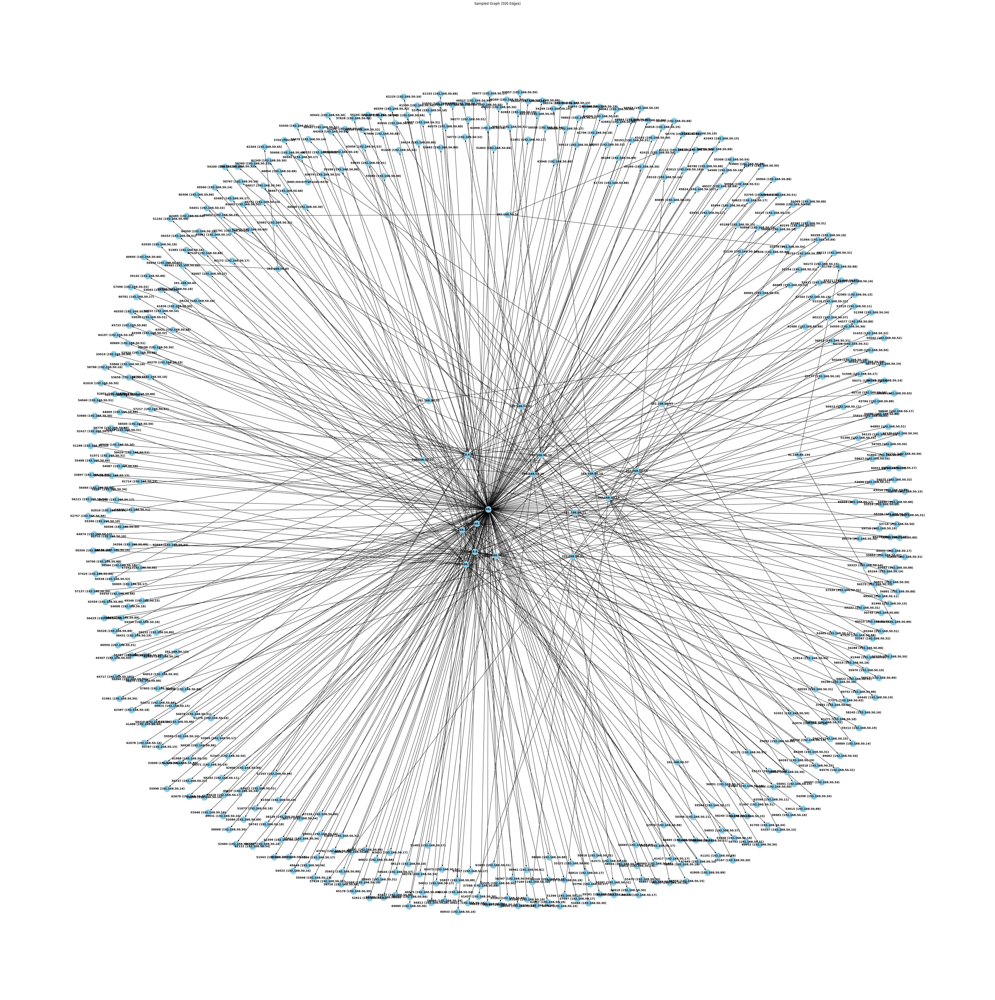

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt

k = 500
sampled_edges = random.sample(list(G.edges), k)
sampled_graph = G.edge_subgraph(sampled_edges)

# Drawing the graph
fig = plt.figure(figsize=(50, 50))
pos = nx.fruchterman_reingold_layout(sampled_graph)
nx.draw(sampled_graph, pos, with_labels=True, node_size=500, node_color="skyblue", font_size=10, font_weight="bold")
plt.title("Sampled Graph (500 Edges)")
plt.show()

**Sauvegarde du graphe**

Indice : utiliser `nx.write_gml`

In [ ]:
# À compléter